In [44]:
#library import
#misc
import pandas as pd
import numpy as np
from datetime import datetime

#time series
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy import stats
from sklearn import metrics

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# preprocessing
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# keras models
from tensorflow.keras.layers import LSTM, Dense, GRU, Activation, BatchNormalization, Dropout, LeakyReLU
from tensorflow.keras.models import Sequential, load_model
from keras import backend as K
from keras.optimizers import RMSprop, Adam
from keras.callbacks import ModelCheckpoint


#holidays
import holidays
warnings.filterwarnings("ignore")
sns.set(rc={'figure.figsize':(25, 8)})

### Set Holidays

In [45]:
date = []
name = []

for ptr in holidays.Italy(years = [2018, 2019, 2020]).items(): 
    date.append(ptr[0])
    name.append(ptr[1])
ih = pd.DataFrame(data = name, index = date)
ih.rename(columns = {0 : "holiday"}, inplace = True)

In [46]:
ih.head()

,holiday
2018-01-01,Capodanno
2018-01-06,Epifania del Signore
2018-04-01,Pasqua di Resurrezione
2018-04-02,Lunedì dell'Angelo
2018-04-25,Festa della Liberazione


### Import time series

In [47]:
#data import 
df = pd.read_csv("TrainingSet.csv", sep = ";")

In [48]:
df['date'] = pd.to_datetime(df['DATA']) + pd.to_timedelta(df['Ora'], 'h')
df = df.loc[:, ['date', 'VALORE']]
df = df.set_index(df['date'])
df.drop(columns = ['date'], inplace = True)
df.head()

,VALORE
date,
2018-09-01 01:00:00,3646742
2018-09-01 02:00:00,3273110
2018-09-01 03:00:00,3069245
2018-09-01 04:00:00,2969621
2018-09-01 05:00:00,2944116


In [49]:
df['Year'] = df.index.year
df['Month'] = df.index.month
df['Hour'] = df.index.hour
df['Weekday_Name'] = df.index.day_name()

Text(0.5, 1.0, 'Time Series')

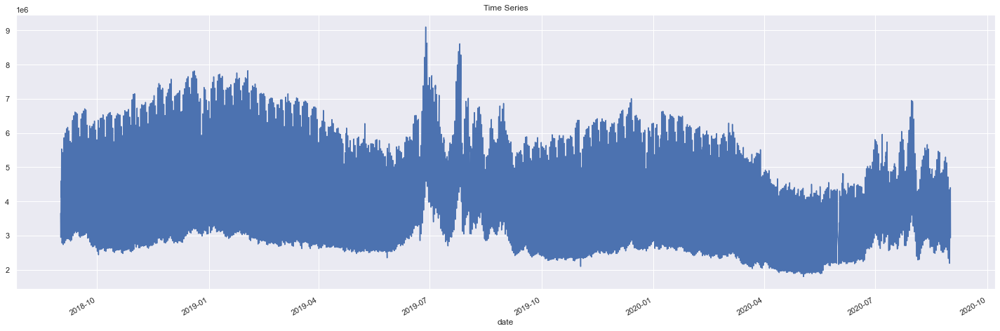

In [50]:
df["VALORE"].plot(figsize = (25, 8))
plt.title('Time Series')

<AxesSubplot:title={'center':'Time series for one month'}, xlabel='date'>

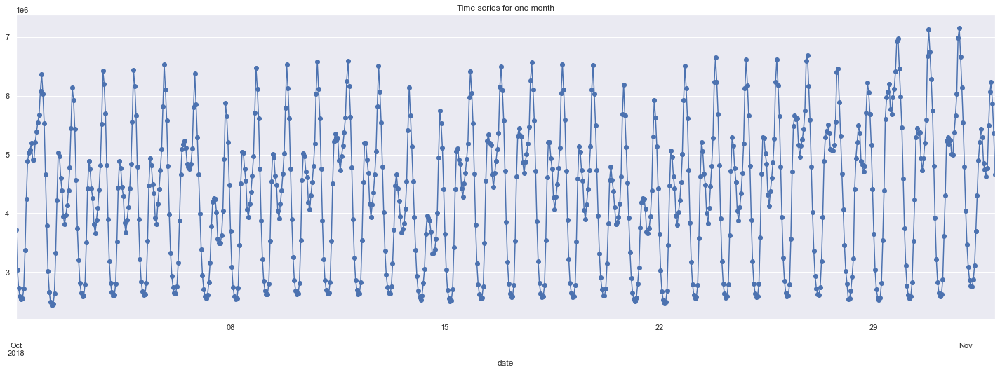

In [51]:
df.loc['2018-10-01':'2018-11-01', 'VALORE'].plot(marker = 'o', linestyle = '-', title = "Time series for one month")

<AxesSubplot:title={'center':'Time series for two day'}, xlabel='date'>

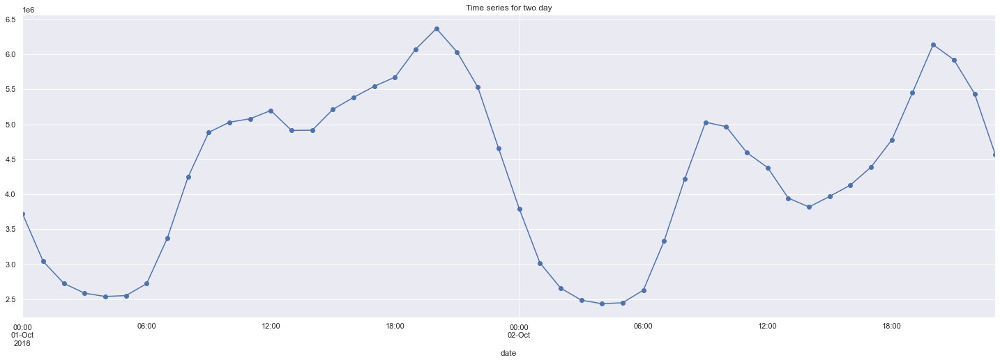

In [52]:
df.loc['2018-10-01':'2018-10-02', 'VALORE'].plot(marker='o', linestyle='-', title= "Time series for two day")

In [53]:
# Creazione serie storica
y = df['VALORE'].resample('H').sum()

### AD - FULLER TEST

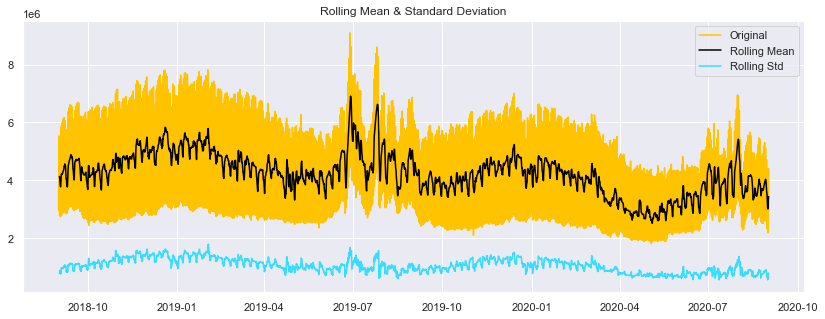

<Results of Dickey-Fuller Test>
Test Statistic                    -5.485109
p-value                            0.000002
#Lags Used                        44.000000
Number of Observations Used    17473.000000
Critical Value (1%)               -3.430724
Critical Value (5%)               -2.861705
Critical Value (10%)              -2.566858
dtype: float64


In [54]:
df2 = df.resample('H').mean()

def test_stationarity(timeseries):
    rolmean = timeseries.rolling(window = 24).mean()
    rolstd = timeseries.rolling(window = 24).std()
    
    plt.figure(figsize=(14,5))
    sns.despine(left=True)
    orig = plt.plot(timeseries, color = '#FFC300',label = 'Original')
    mean = plt.plot(rolmean, color = 'black', label = 'Rolling Mean')
    std = plt.plot(rolstd, color = '#38DCFF', label = 'Rolling Std')

    plt.legend(loc='best'); plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    print ('<Results of Dickey-Fuller Test>')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],
                         index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(df2.VALORE.dropna())

# P-value molto piccolo, la serie sembra essere stazionaria

In [55]:
# Trasformo i valori mancanti tramite interpolazione lineare
y[y == 0] = np.nan
y = y.interpolate(method = "linear")

**I dati sembrano abbastanza simmetrici con un valore di 0.33**

Askewness of normal distribution: 0.3350264162026123


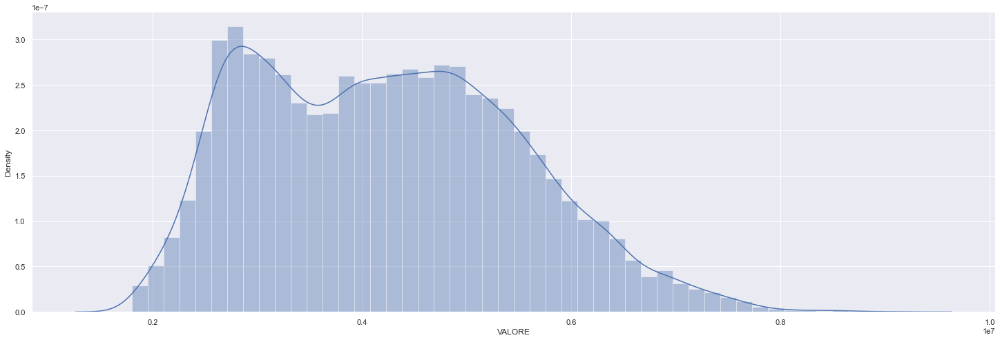

In [56]:
sns.distplot(df.VALORE); 
print ('Askewness of normal distribution: {}'. format (stats.skew (df.VALORE)))

array([[<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>]], dtype=object)

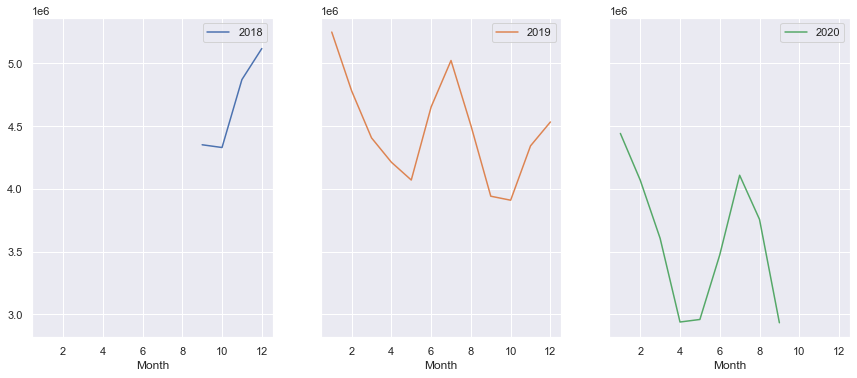

In [57]:
pd.pivot_table(df, values = "VALORE", 
               columns = "Year", index = "Month").plot(subplots = True, figsize=(25, 20), layout=(3, 5), sharey=True)

**Si nota come nel weekend i valori tendono ad essere più bassi**

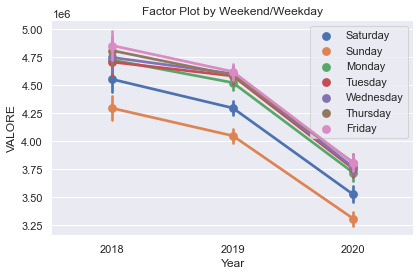

In [58]:
plt1=sns.factorplot('Year', 'VALORE', hue = 'Weekday_Name',
                    data = df, size = 4, aspect = 1.5, legend = False)                                                                                                                                                                                                                                                                                                                                             
plt.title('Factor Plot by Weekend/Weekday')                                                             
plt.tight_layout()                                                                                                                  
sns.despine(left=True, bottom=True) 
plt.legend(loc = 'upper right')

## Regressori

In [59]:
xreg = pd.DataFrame(columns = ["datetime", "is_covid", "is_holiday"])
xreg_f = pd.DataFrame(columns = ["datetime", "sin7", "cos7", "sin365", "cos365"])

In [60]:
xreg["datetime"] = y.index
xreg_f["datetime"] = y.index
xreg = xreg.set_index(xreg['datetime'])
xreg_f = xreg_f.set_index(xreg_f['datetime'])

In [61]:
xreg["is_weekend"] = y.index.map(lambda x : 1 if x.weekday() > 4 else 0) 

In [62]:
ih.reset_index(inplace = True)
ih['index'] = ih['index'].apply(lambda x: pd.to_datetime(x, format = "%Y-%m-%d"))
xreg["is_holiday"] = y.index.map(lambda x : 1 if x in ih.index else 0) 

In [63]:
# Si è scelto di mantenere il periodo di Covid come solo ed unicamente il primo lockdown
xreg["is_covid"] = y.index.map(lambda x : 1 if (x > pd.to_datetime("2020-03-10") and (x < pd.to_datetime("2020-05-04"))) else 0)

In [64]:
xreg_f['sin7'] = np.sin(2 * np.pi * xreg_f.index.dayofyear / 7)
xreg_f['cos7'] = np.cos(2 * np.pi * xreg_f.index.dayofyear / 7)
xreg_f['sin365'] = np.sin(2 * np.pi * xreg_f.index.dayofyear / 365.25)
xreg_f['cos365'] = np.cos(2 * np.pi * xreg_f.index.dayofyear / 365.25)

In [65]:
xreg = xreg[["is_weekend", "is_covid", "is_holiday"]]
xreg.head()

,is_weekend,is_covid,is_holiday
datetime,,,
2018-09-01 01:00:00,1,0,0
2018-09-01 02:00:00,1,0,0
2018-09-01 03:00:00,1,0,0
2018-09-01 04:00:00,1,0,0
2018-09-01 05:00:00,1,0,0


In [66]:
xreg_f = xreg_f[["sin7", "cos7", "sin365", "cos365"]]
xreg_f.head()

,sin7,cos7,sin365,cos365
datetime,,,,
2018-09-01 01:00:00,-0.781831,0.62349,-0.870294,-0.492533
2018-09-01 02:00:00,-0.781831,0.62349,-0.870294,-0.492533
2018-09-01 03:00:00,-0.781831,0.62349,-0.870294,-0.492533
2018-09-01 04:00:00,-0.781831,0.62349,-0.870294,-0.492533
2018-09-01 05:00:00,-0.781831,0.62349,-0.870294,-0.492533


In [67]:
xreg_train = xreg.join(xreg_f)

In [68]:
del [xreg, xreg_f]

### Regressori per previsione

In [69]:
xreg_p = pd.DataFrame(columns = ["datetime", "is_holiday", "is_covid", "is_weekend"])
xreg_p['datetime'] = pd.date_range('2020-09-01 01:00', periods = 24*61, freq = 'H')
xreg_p.set_index('datetime', inplace = True)
xreg_p['is_weekend'] = xreg_p.index.map(lambda x : 1 if x.weekday() > 4 else 0)
xreg_p['is_covid'] = xreg_p.index.map(lambda x : 1 if (x > pd.to_datetime("2020-03-10") and (x < pd.to_datetime("2020-05-04"))) else 0) 
xreg_p["is_holiday"] = xreg_p.index.map(lambda x : 1 if x in ih.index else 0) 
xreg_p_f = pd.DataFrame(columns=["datetime", "sin7", "cos7", "sin365", "cos365"])
xreg_p_f['datetime'] = pd.date_range('2020-09-01 01:00', periods = 24*61, freq='H')
xreg_p_f.set_index('datetime', inplace = True)
xreg_p_f['sin7'] = np.sin(2 * np.pi * xreg_p_f.index.dayofyear / 7)
xreg_p_f['cos7'] = np.cos(2 * np.pi * xreg_p_f.index.dayofyear / 7)
xreg_p_f['sin365'] = np.sin(2 * np.pi * xreg_p_f.index.dayofyear / 365.25)
xreg_p_f['cos365'] = np.cos(2 * np.pi * xreg_p_f.index.dayofyear / 365.25)

In [71]:
xreg_test = xreg_p.join(xreg_p_f)

In [72]:
del [xreg_p, xreg_p_f]

In [73]:
del [ih]

### Split dataset in 80% e 20%

In [74]:
train = y[y.index <= ('2020-04-01')]
test = y[y.index > ('2020-04-01')]
print("Train size: " + str(round((len(train) / len(y) * 100), 2)) + "%")
print("Test size: " + str(round((len(test) / len(y) * 100), 2)) + "%")

Train size: 79.07%
Test size: 20.93%


### Funzioni

In [75]:
def make_prediction_test(mod, y_true, start, end, xreg):
    y_pred = mod.predict(start = start, end = end, exog = xreg, typ = 'linear', dynamic = False)
    mae = metrics.mean_absolute_error(y_pred = y_pred[1:], y_true = y_true[1:])
    print("Mean absolute error TEST: " + str(mae))
    return mae


def make_prediction_train(mod, y_true, start, end, xreg):
    y_pred = mod.predict(start = start, end = end, exog = xreg, typ = 'linear', dynamic = False)
    mae = metrics.mean_absolute_error(y_pred = y_pred[1:], y_true = y_true[1:])
    print("Mean absolute error TRAIN: " + str(mae))
    return mae


def make_prediction_plot(mod, y_true, start, end, xreg, y_true2, start2, end2, xreg2):
    y_pred = mod.predict(start = start, end = end, exog = xreg, typ = 'linear', dynamic = False)
    y_pred2 = mod.predict(start = start2, end = end2, exog = xreg2, typ = 'linear', dynamic = False)
    plt.rcParams.update({'figure.figsize':(20,15)})
    fig1, axes1 = plt.subplots(2, 1, sharex=True)
    axes1[0].set_title("Prevision on TRAIN")
    axes1[0].plot(y_pred2, color = "#33AAFF", label = "Predected")
    axes1[0].plot(y_true2, color = "#FFC300", label = "Original")
    plt.legend()
    axes1[1].set_title("Prevision on TEST")
    axes1[1].plot(y_pred, color = "#33AAFF", label = "Predected")
    axes1[1].plot(y_true, color = "#FFC300", label = "Original")
    plt.legend()
    return y_pred

# ARIMA

In [76]:
def make_arima(data, p, d, q, P, D, Q, period, xreg):
    start = datetime.now()
    mod = sm.tsa.statespace.SARIMAX(data,
                      order=(p, d, q),
                      seasonal_order = (P, D, Q, period),
                      exog = xreg
          )
    mod = mod.fit(disp = 0)
    print(mod.summary())
    stop = datetime.now()
    print("execution time :" + str(stop - start))
    return mod

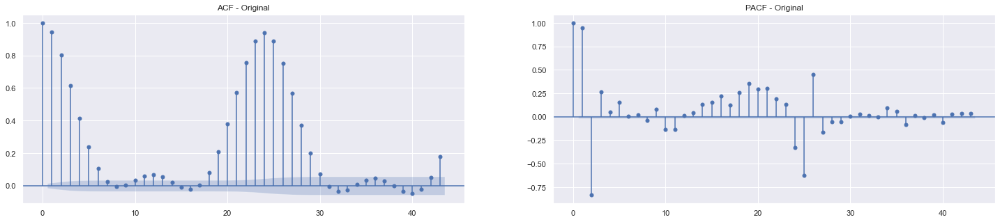

In [77]:
plt.rcParams.update({'figure.figsize' : (25, 5)})
fig1, axes1 = plt.subplots(1, 2, sharex = True)
plot_acf(y, ax = axes1[0])
axes1[0].set_title('ACF - Original')
plot_pacf(y, ax = axes1[1])
axes1[1].set_title('PACF - Original')
plt.show()

**Sembra esserci un stagionalità ogni 24 ritardi, vale a dire giornaliera**

Il grafico sottostante sembrerebbe confermarcelo

<AxesSubplot:title={'center':'Time series for two days'}, xlabel='date'>

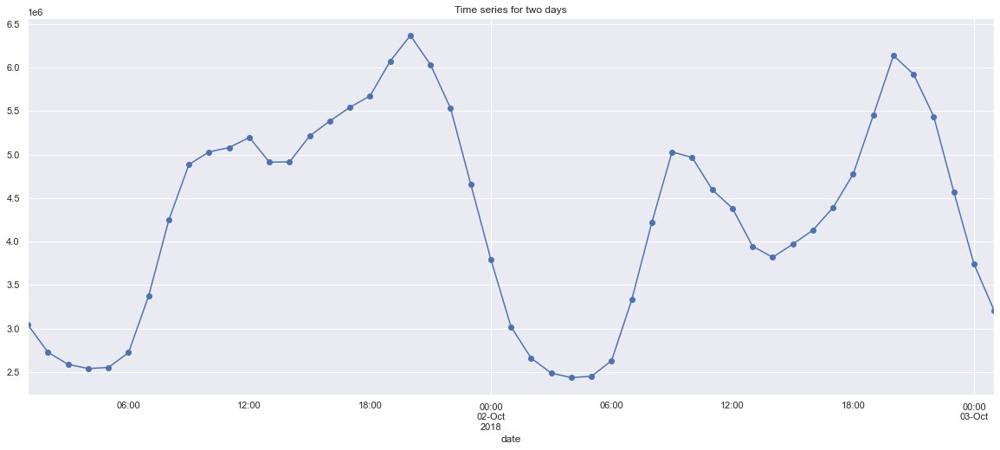

In [89]:
y.loc['2018-10-01 01:00:00':'2018-10-03 01:00:00'].plot(marker = 'o', linestyle = '-', title= "Time series for two days")

**Nel primo modello tutti i coefficienti sembrano essere significativi e i residui rientrare nelle barre di confidenza**

In [36]:
# Arima(4, 0, 0)(1, 1, 1)24 senza regressori
model1 = make_arima(train, 4, 0, 0, 1, 1, 1, 24, None)

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                13872
Model:             SARIMAX(4, 0, 0)x(1, 1, [1], 24)   Log Likelihood             -179936.847
Date:                              Sun, 21 Mar 2021   AIC                         359887.693
Time:                                      11:20:01   BIC                         359940.445
Sample:                                  09-01-2018   HQIC                        359905.264
                                       - 04-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5372      0.003    613.159      0.000       1.532       1.542
ar.L2         -0.70

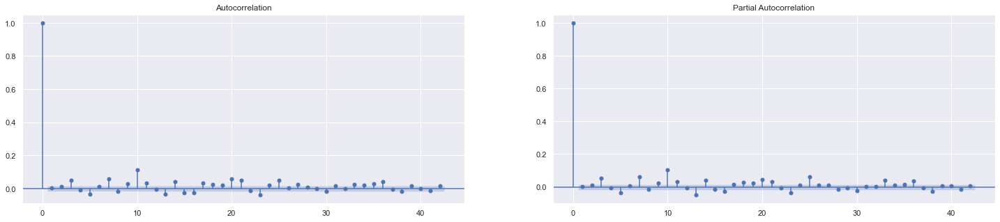

In [38]:
fig1, axes1 = plt.subplots(1, 2, sharex = True)
plot_acf(model1.resid, ax = axes1[0])
plot_pacf(model1.resid, ax = axes1[1])
plt.show()

### GRID SEARCH

**Utilizzo una grid search per cercare i migliori parametri dei coefficienti non stagionali
basandomi sull'AIC**

In [30]:
import time
from tqdm import tqdm_notebook

best_aic = 999999
for i in tqdm_notebook(range(6)):
  for j in range(4):
    model = make_arima(train, i, 0, j, 1, 1, 1, 24, None)
    aic = model.aic
    bic = model.bic
    if aic <= best_aic:
        best_aic = aic
        params = ((i, j))
    print('AR {} -- MA {},  AIC current: {}, BIC current: {}'.format(i, j, round(aic, 2), round(bic, 2), params))
    print('BEST AR {} -- MA {},  with AIC: {}'.format(params[0], params[1], best_aic))
print('----------------------------------------')
print('BEST AR {} -- MA {},  with AIC: {}'.format(params[0], params[1], best_aic))

                                 SARIMAX Results                                  
Dep. Variable:                     VALORE   No. Observations:                13872
Model:             SARIMAX(1, 1, [1], 24)   Log Likelihood             -198702.431
Date:                    Wed, 13 Jan 2021   AIC                         397410.862
Time:                            15:17:11   BIC                         397433.470
Sample:                        09-01-2018   HQIC                        397418.393
                             - 04-01-2020                                         
Covariance Type:                      opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L24       0.5481      0.008     67.634      0.000       0.532       0.564
ma.S.L24      -0.8840      0.005   -163.008      0.000      -0.895      -0.873
sigma2      1.913e+1

**Il miglior modello sembrerebbe essere un ARMA(5, 3) per quanto riguarda la parte non stagionale andando a valutare l'AIC.**

**Plotto le diagnostiche per valure la normalità ed i correlogrammi.**

### Modello 1

In [33]:
model1 = make_arima(train, 5, 0, 3, 1, 1, 1, 24, None)

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                13872
Model:             SARIMAX(5, 0, 3)x(1, 1, [1], 24)   Log Likelihood             -179815.993
Date:                              Wed, 13 Jan 2021   AIC                         359653.986
Time:                                      16:19:06   BIC                         359736.881
Sample:                                  09-01-2018   HQIC                        359681.597
                                       - 04-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.7564      0.035     50.394      0.000       1.688       1.825
ar.L2         -1.77

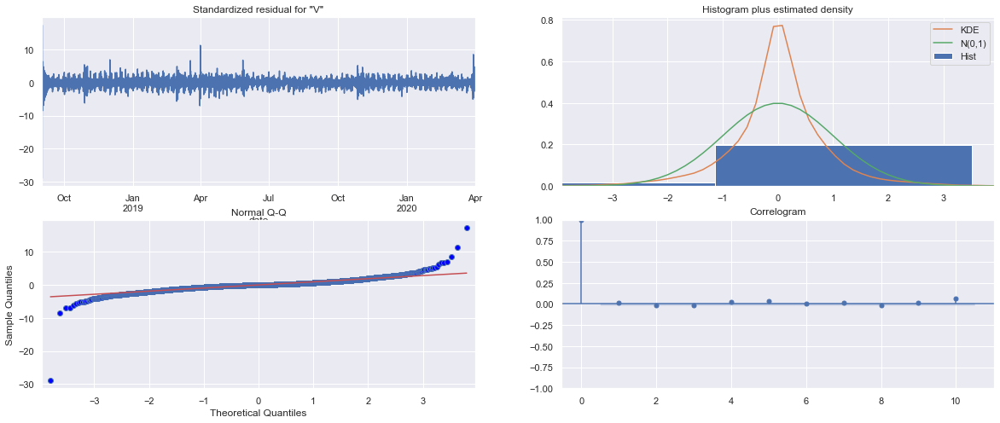

In [34]:
model1.plot_diagnostics(figsize = (20, 8))
plt.show()

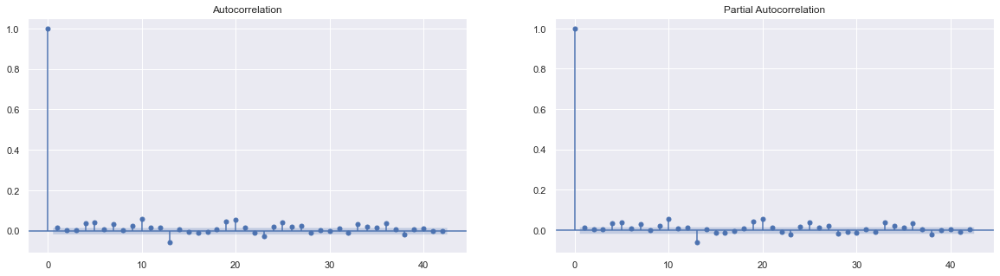

In [35]:
plt.rcParams.update({'figure.figsize' : (20, 5)})
fig1, axes1 = plt.subplots(1, 2, sharex = True)
plot_acf(model1.resid, ax = axes1[0])
plot_pacf(model1.resid, ax = axes1[1])
plt.show()

Mean absolute per error TEST: 0.15093998841194955
Mean absolute error TEST: 524536.5353912284
Mean absolute error TRAIN: 67135.88465664574


No handles with labels found to put in legend.


2020-04-01 01:00:00    2.717228e+06
2020-04-01 02:00:00    2.323847e+06
2020-04-01 03:00:00    2.156140e+06
2020-04-01 04:00:00    2.097136e+06
2020-04-01 05:00:00    2.086015e+06
                           ...     
2020-08-31 20:00:00    4.969946e+06
2020-08-31 21:00:00    4.839552e+06
2020-08-31 22:00:00    4.418046e+06
2020-08-31 23:00:00    3.776730e+06
2020-09-01 00:00:00    3.206197e+06
Freq: H, Name: predicted_mean, Length: 3672, dtype: float64

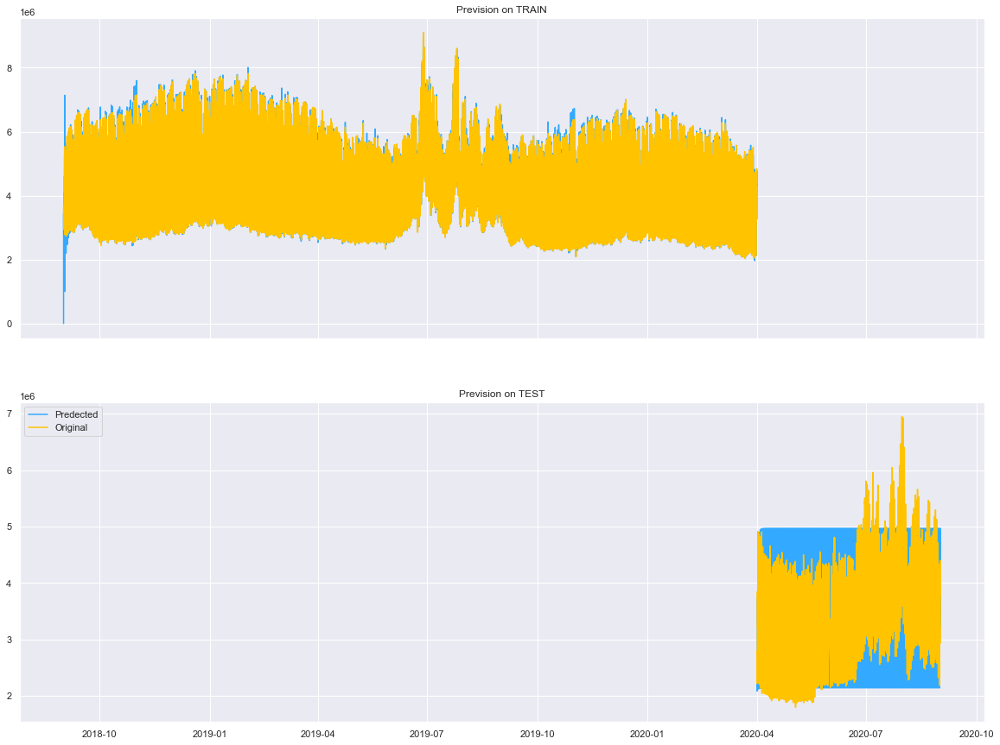

In [36]:
make_prediction_test(model1, test, test.index[0], test.index[len(test) - 1], None)
make_prediction_train(model1, train, train.index[0], train.index[len(train) - 1], None)
make_prediction_plot(model1, test, test.index[0], test.index[len(test) - 1], None,
                       train, train.index[0], train.index[len(train) - 1], None)

**Il modello sembra avere tutti i paramentri significati.**

**Mean absolute error TEST: 524536.5353912284**

**Mean absolute error TRAIN: 67135.88465664574**

### Regressori Weekend, Holiday, Covid

### Modello 2

In [38]:
xreg_train_hol = xreg_train[ : len(train)][['is_weekend', 'is_covid', 'is_holiday']]
model2 = make_arima(train, 5, 0, 3, 1, 1, 1, 24, xreg_train_hol)

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                13872
Model:             SARIMAX(5, 0, 3)x(1, 1, [1], 24)   Log Likelihood             -181394.990
Date:                              Wed, 13 Jan 2021   AIC                         362817.981
Time:                                      16:28:59   BIC                         362923.483
Sample:                                  09-01-2018   HQIC                        362853.123
                                       - 04-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
is_weekend -3.773e+05   3219.401   -117.191      0.000   -3.84e+05   -3.71e+05
is_covid    -1.34e+

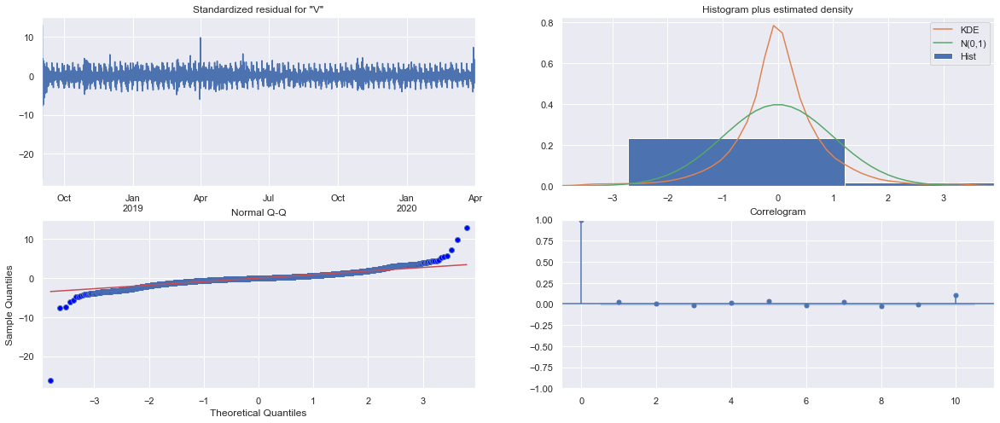

In [39]:
model2.plot_diagnostics(figsize = (20, 8))
plt.show()

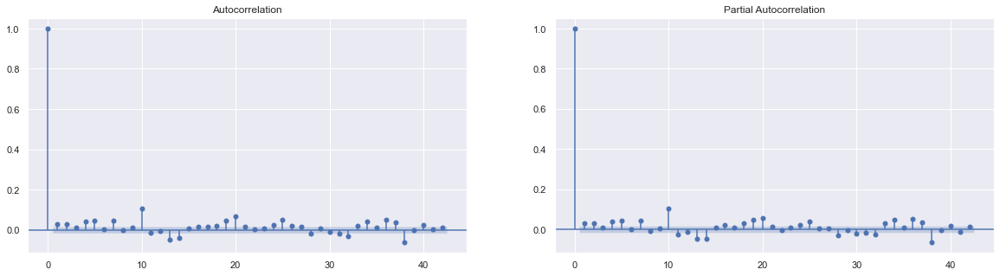

In [40]:
plt.rcParams.update({'figure.figsize' : (20, 5)})
fig1, axes1 = plt.subplots(1, 2, sharex = True)
plot_acf(model2.resid, ax = axes1[0])
plot_pacf(model2.resid, ax = axes1[1])
plt.show()

Mean absolute per error TEST: 0.14381532363567026
Mean absolute error TEST: 489753.69009218225
Mean absolute error TRAIN: 75837.95120059943


No handles with labels found to put in legend.


2020-04-01 01:00:00    2.715766e+06
2020-04-01 02:00:00    2.326199e+06
2020-04-01 03:00:00    2.173500e+06
2020-04-01 04:00:00    2.110509e+06
2020-04-01 05:00:00    2.086538e+06
                           ...     
2020-08-31 20:00:00    5.213211e+06
2020-08-31 21:00:00    5.067225e+06
2020-08-31 22:00:00    4.643077e+06
2020-08-31 23:00:00    4.000757e+06
2020-09-01 00:00:00    3.418703e+06
Freq: H, Name: predicted_mean, Length: 3672, dtype: float64

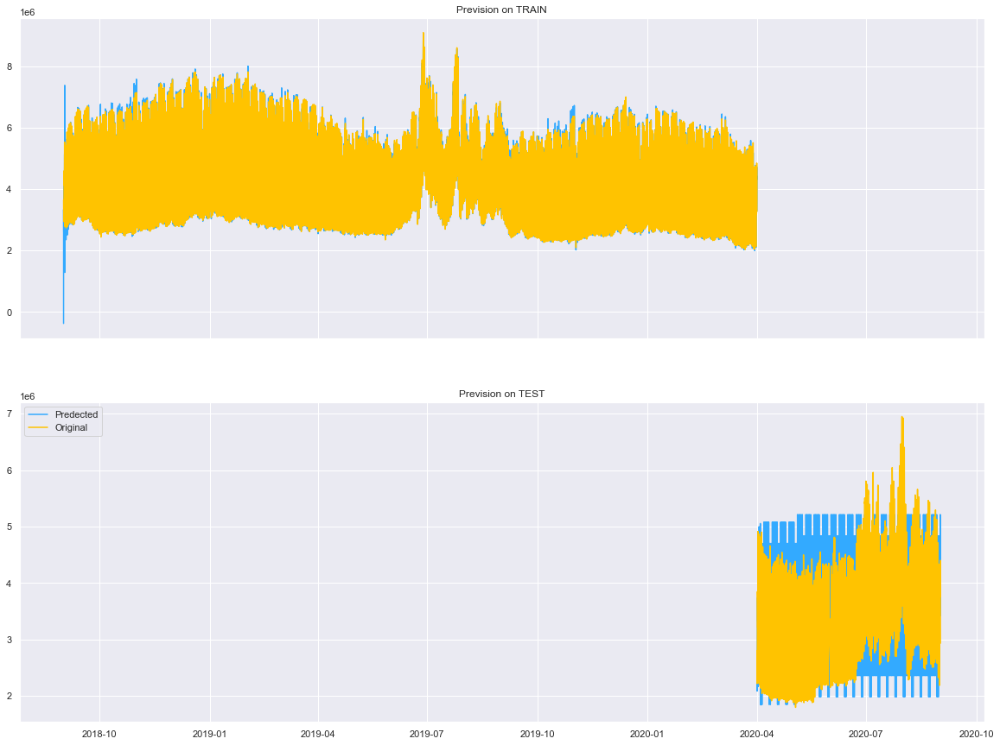

In [41]:
xreg_test_hol = xreg_test[len(train) : ][['is_weekend', 'is_covid', 'is_holiday']]
make_prediction_test(model2, test, test.index[0], test.index[len(test) - 1], xreg_test_hol)
make_prediction_train(model2, train, train.index[0], train.index[len(train) - 1], xreg_train_hol)
make_prediction_plot(model2, test, test.index[0], test.index[len(test) - 1], xreg_test_hol,
                       train, train.index[0], train.index[len(train) - 1], xreg_train_hol)

**I regressori sembrano essere tutti significati tranne quelli riguardanti le feste, li rimuovo e ricalcolo con l'inserimento di sinusoidi annuali e settimanali**

**Mean absolute error TEST: 489753.69009218225**

**Mean absolute error TRAIN: 75837.95120059943**

### Modello 3

In [35]:
trainx = xreg_train[ : len(train)][['is_weekend', 'is_covid', 'sin7', 'cos7', 'sin365', 'cos365']]
model3 = make_arima(train, 5, 0, 3, 1, 1, 1, 24, trainx)

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                13872
Model:             SARIMAX(5, 0, 3)x(1, 1, [1], 24)   Log Likelihood             -181460.685
Date:                              Mon, 18 Jan 2021   AIC                         362955.371
Time:                                      15:04:52   BIC                         363083.481
Sample:                                  09-01-2018   HQIC                        362998.043
                                       - 04-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
is_weekend  -3.76e+05   2509.298   -149.823      0.000   -3.81e+05   -3.71e+05
is_covid   -1.018e+

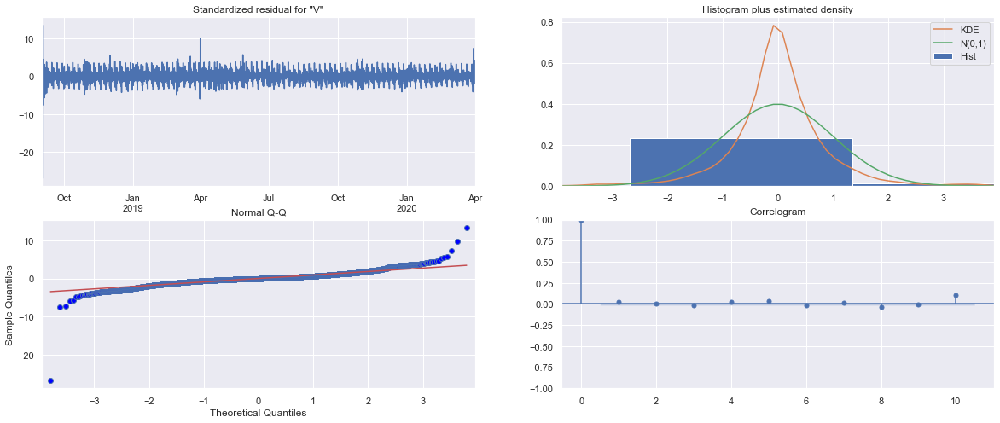

In [36]:
model3.plot_diagnostics(figsize = (20, 8))
plt.show()

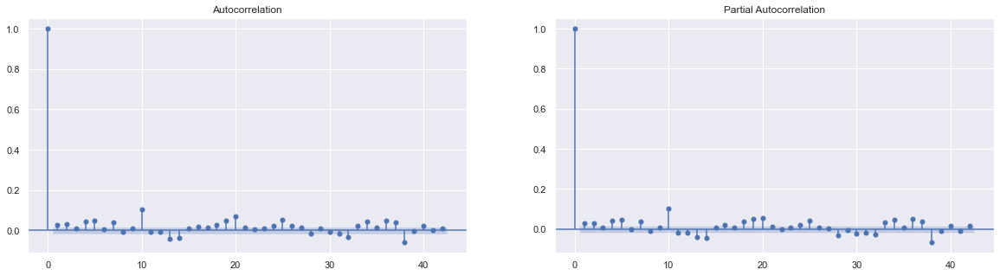

In [37]:
plt.rcParams.update({'figure.figsize' : (20, 5)})
fig1, axes1 = plt.subplots(1, 2, sharex = True)
plot_acf(model3.resid, ax = axes1[0])
plot_pacf(model3.resid, ax = axes1[1])
plt.show()

Mean absolute per error TEST: 0.14556231616237356
Mean absolute error TEST: 514593.800514518
Mean absolute error TRAIN: 75960.67231367974
No handles with labels found to put in legend.


2020-04-01 01:00:00    2.701672e+06
2020-04-01 02:00:00    2.304007e+06
2020-04-01 03:00:00    2.147939e+06
2020-04-01 04:00:00    2.087767e+06
2020-04-01 05:00:00    2.067622e+06
                           ...     
2020-08-31 20:00:00    5.136861e+06
2020-08-31 21:00:00    4.987730e+06
2020-08-31 22:00:00    4.563340e+06
2020-08-31 23:00:00    3.920572e+06
2020-09-01 00:00:00    3.325499e+06
Freq: H, Name: predicted_mean, Length: 3672, dtype: float64

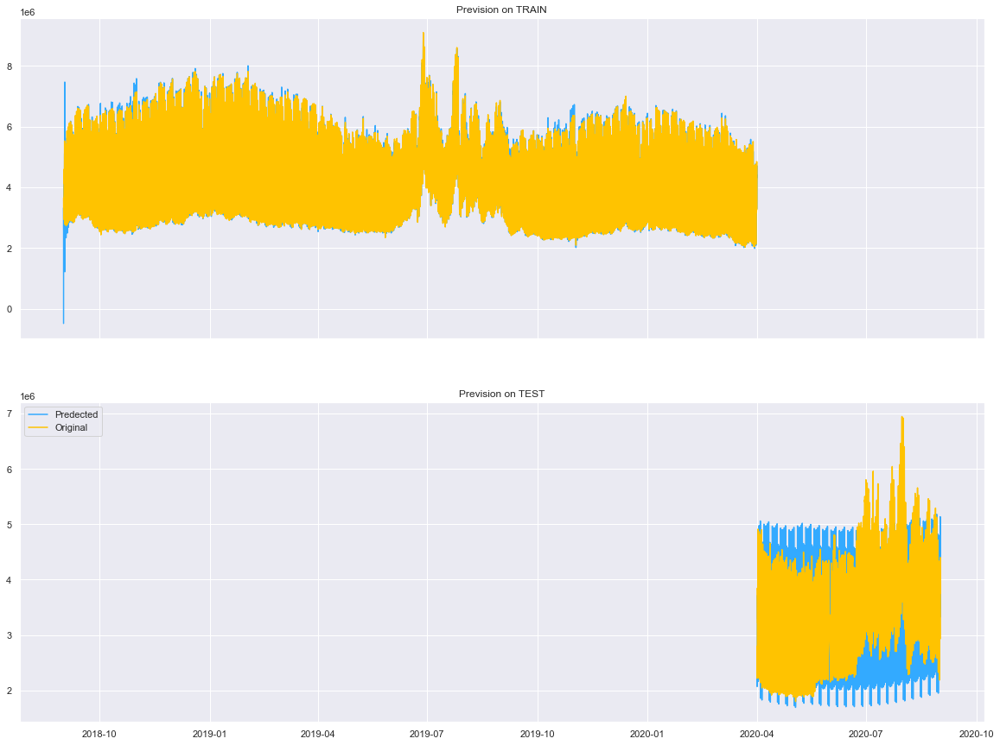

In [38]:
testx = xreg_train[len(train):][['is_weekend', 'is_covid', 'sin7', 'cos7', 'sin365', 'cos365']]
make_prediction_test(model3, test, test.index[0], test.index[len(test) - 1], testx)
make_prediction_train(model3, train, train.index[0], train.index[len(train) - 1], trainx)
make_prediction_plot(model3, test, test.index[0], test.index[len(test) - 1], testx,
                       train, train.index[0], train.index[len(train) - 1], trainx)

**Il modello sembra avere tutto significativo, i valori del MAE si alzano. Provo lo stesso modello andando a togliere il regressore settimanale**

**Mean absolute error TEST: 514593.800514518**

**Mean absolute error TRAIN: 75960.67231367974**

### Modello 4

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                13872
Model:             SARIMAX(5, 0, 3)x(1, 1, [1], 24)   Log Likelihood             -181418.052
Date:                              Mon, 18 Jan 2021   AIC                         362866.104
Time:                                      15:38:17   BIC                         362979.143
Sample:                                  09-01-2018   HQIC                        362903.756
                                       - 04-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
is_weekend -3.773e+05   3214.325   -117.371      0.000   -3.84e+05   -3.71e+05
is_covid   -1.281e+

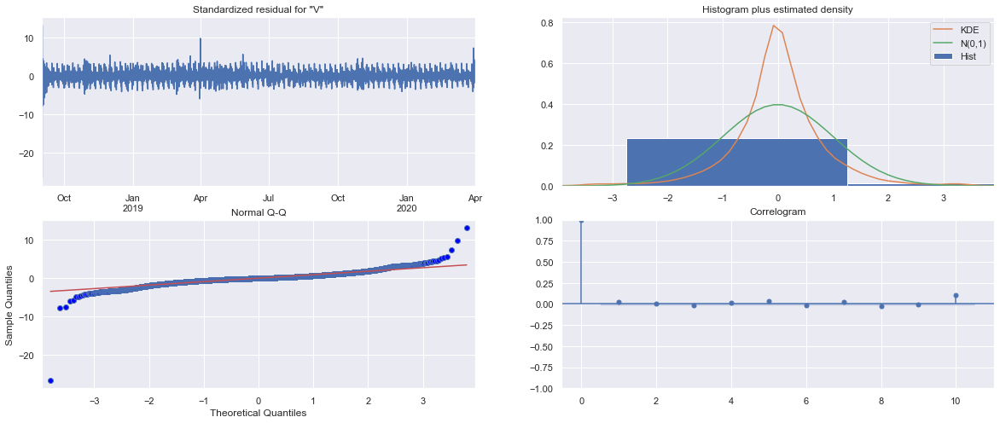

In [45]:
trainx = xreg_train[ : len(train)][['is_weekend', 'is_covid', 'sin365', 'cos365']]
model3 = make_arima(train, 5, 0, 3, 1, 1, 1, 24, trainx)
model3.plot_diagnostics(figsize = (20, 8))
plt.show()

Mean absolute per error TEST: 0.14483747230411478
Mean absolute error TEST: 511424.4118288886
Mean absolute error TRAIN: 75856.70137129867
No handles with labels found to put in legend.


2020-04-01 01:00:00    2.713606e+06
2020-04-01 02:00:00    2.320663e+06
2020-04-01 03:00:00    2.165467e+06
2020-04-01 04:00:00    2.100877e+06
2020-04-01 05:00:00    2.075147e+06
                           ...     
2020-08-31 20:00:00    5.169012e+06
2020-08-31 21:00:00    5.022160e+06
2020-08-31 22:00:00    4.597812e+06
2020-08-31 23:00:00    3.955293e+06
2020-09-01 00:00:00    3.384741e+06
Freq: H, Name: predicted_mean, Length: 3672, dtype: float64

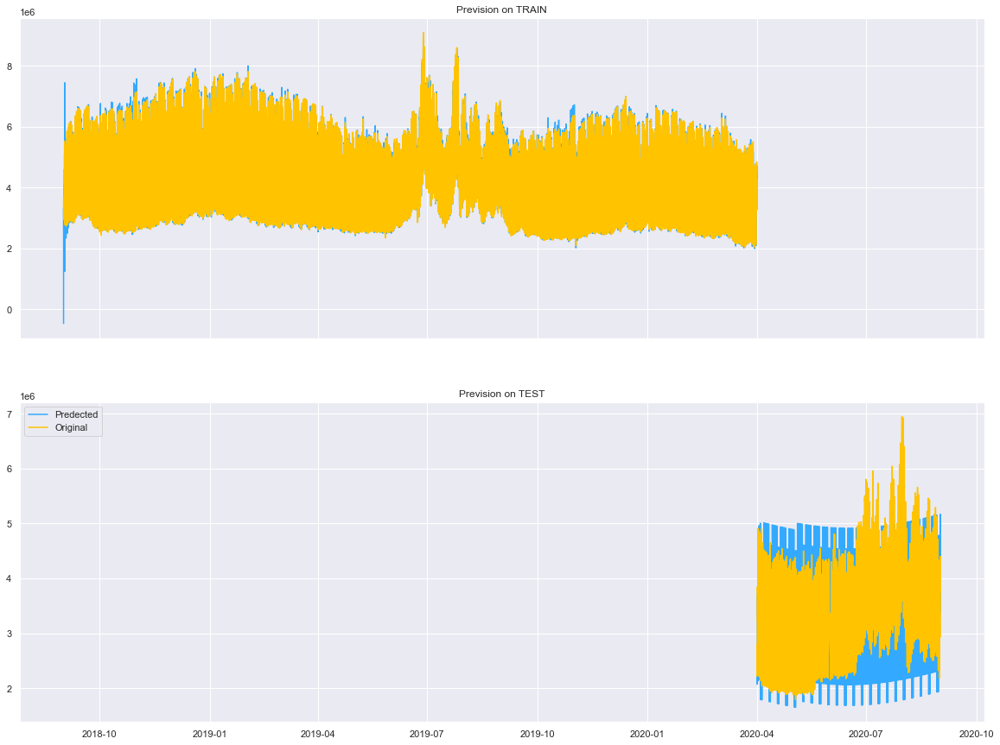

In [47]:
testx = xreg_train[len(train):][['is_weekend', 'is_covid', 'sin365', 'cos365']]
make_prediction_test(model3, test, test.index[0], test.index[len(test) - 1], testx)
make_prediction_train(model3, train, train.index[0], train.index[len(train) - 1], trainx)
make_prediction_plot(model3, test, test.index[0], test.index[len(test) - 1], testx,
                       train, train.index[0], train.index[len(train) - 1], trainx)

**Il modello migliore sembra essere il modello 4.. ARIMA(5, 0, 3, 1, 1, 1, 24) con regressori Covid, Weekend e sinusoidi annuali**

**Mean absolute error TEST: 511424.4118288886**

**Mean absolute error TRAIN: 75856.70137129867**

### Previsione ARIMA

In [79]:
final_arima = make_arima(y, 5, 0, 3, 1, 1, 1, 24, xreg_train[['is_weekend', 'is_covid', 'sin365', 'cos365']])

                                      SARIMAX Results                                       
Dep. Variable:                               VALORE   No. Observations:                17544
Model:             SARIMAX(5, 0, 3)x(1, 1, [1], 24)   Log Likelihood             -229074.419
Date:                              Sat, 22 May 2021   AIC                         458178.839
Time:                                      11:24:43   BIC                         458295.405
Sample:                                  09-01-2018   HQIC                        458217.222
                                       - 09-01-2020                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
is_weekend -3.771e+05   2841.928   -132.705      0.000   -3.83e+05   -3.72e+05
is_covid    4.291e+

In [91]:
xreg_prev_arima = xreg_test[['is_weekend', 'is_covid', 'sin365', 'cos365']]
pred_arima = final_arima.predict(start = xreg_prev_arima.index[0], end = xreg_prev_arima.index[len(xreg_prev_arima) - 1], exog = xreg_prev_arima, typ = 'linear', dynamic = False)

In [92]:
results_arima = pd.DataFrame(columns=['date', 'arima'])
results_arima['date'] = pred_arima.index
results_arima['arima'] = pred_arima.values
results_arima.set_index('date', inplace = True)

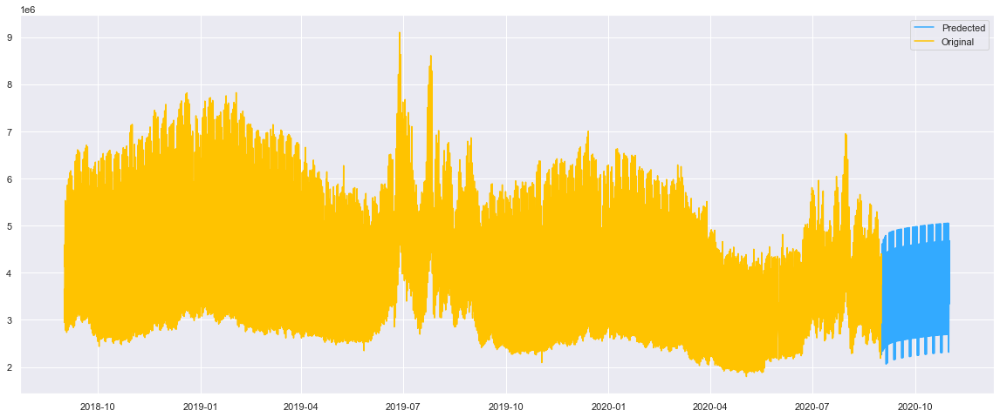

In [93]:
plt.rcParams.update({'figure.figsize' :  (20, 8)})
plt.plot(pred_arima, color = "#33AAFF", label = "Predected")
plt.plot(y, color = "#FFC300", label = "Original")
plt.legend()

In [83]:
results_arima = results_arima.rename(columns = {"arima" : "VALORE"})
arima = pd.concat([df, results_arima])

array([[<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>]], dtype=object)

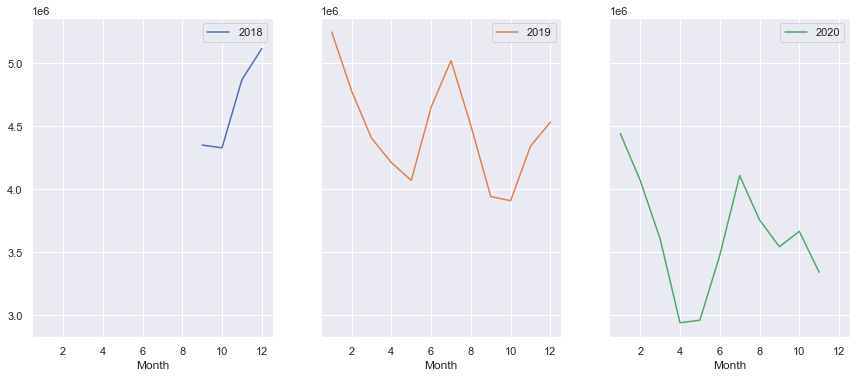

In [84]:
arima['Year'] = arima.index.year
arima['Month'] = arima.index.month
arima['Hour'] = arima.index.hour
arima['Weekday_Name'] = arima.index.day_name()
pd.pivot_table(arima, values = "VALORE", 
               columns = "Year", index = "Month").plot(subplots = True, figsize=(25, 20), layout=(3, 5), sharey=True)

# UCM

**Valuto il miglior trend confrontando i MAE con stagionalità giornaliera dummy**

In [64]:
trends = ['llevel', 'rwalk', 'lldtrend', 'rwdrift', 'lltrend']
for t in trends:
    print(t)
    modUCM = sm.tsa.UnobservedComponents(train, t, cycle = True, seasonal = 24, stochastic_seasonal = True)                          
    modUCM = modUCM.fit()
    mae_test = make_prediction_test(modUCM, test, test.index[0], test.index[len(test) - 1], None)
    mae_train = make_prediction_train(modUCM, train, train.index[0], train.index[len(train) - 1], None)
    print("Sum of MAE: " + str(mae_train + mae_test))

llevel
Mean absolute error TEST: 532924.1727847797
Mean absolute error TRAIN: 221612.56893984915
Sum of MAE: 754536.7417246288
rwalk
Mean absolute error TEST: 529265.645551437
Mean absolute error TRAIN: 213488.70256731904
Sum of MAE: 742754.3481187561
lldtrend
Mean absolute error TEST: 525518.2474404817
Mean absolute error TRAIN: 221611.8652288258
Sum of MAE: 747130.1126693075
rwdrift
Mean absolute error TEST: 524770.5316494934
Mean absolute error TRAIN: 213488.85524060036
Sum of MAE: 738259.3868900938
lltrend
Mean absolute error TEST: 301920367.4418231
Mean absolute error TRAIN: 184663.97486119176
Sum of MAE: 302105031.4166843


**Testo una stagionalità giornaliera con 10 armoniche**

In [50]:
trends = ['llevel', 'rwalk', 'lldtrend', 'rwdrift', 'lltrend']
for t in trends:
    print(t)
    modUCM = sm.tsa.UnobservedComponents(train, t, cycle = True, freq_seasonal = [{'period' : 24, 'harmonic' : 10}])                          
    modUCM = modUCM.fit()
    mae_test = make_prediction_test(modUCM, test, test.index[0], test.index[len(test) - 1], None)
    mae_train = make_prediction_train(modUCM, train, train.index[0], train.index[len(train) - 1], None)
    print("Sum of MAE: " + str(mae_train + mae_test))

llevel
Mean absolute per error TEST: 0.15075836523810596
Mean absolute error TEST: 523338.61684684694
Mean absolute error TRAIN: 337063.7942826471
Sum of MAE: 860402.411129494
rwalk
Mean absolute per error TEST: 0.15076980616180616
Mean absolute error TEST: 523364.2367440538
Mean absolute error TRAIN: 336766.3791980775
Sum of MAE: 860130.6159421313
lldtrend
Mean absolute per error TEST: 0.14920848062412218
Mean absolute error TEST: 516550.5297299054
Mean absolute error TRAIN: 337060.19051200943
Sum of MAE: 853610.7202419149
rwdrift
Mean absolute per error TEST: 0.14933894390425576
Mean absolute error TEST: 517098.2695504795
Mean absolute error TRAIN: 336763.33308799844
Sum of MAE: 853861.6026384779
lltrend
Mean absolute per error TEST: 2.432912744624786
Mean absolute error TEST: 8279293.411218377
Mean absolute error TRAIN: 206411.43160475395
Sum of MAE: 8485704.842823131


**Una volta scelto il RW con drift (stagionalità dummy 24) testo la significatività dei suoi coefficienti**

**MAE: 738690.7625293671**

In [51]:
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                      cycle = True,
                                      seasonal = 24, 
                                      stochastic_seasonal = True
                                     )
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
print(modUCM2.summary())
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], None)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], None)
print("Sum of MAE: " + str(mae_train + mae_test))

-------------------------------------
execution time :0:00:10.430430
-------------------------------------
                            Unobserved Components Results                            
Dep. Variable:                        VALORE   No. Observations:                13872
Model:                random walk with drift   Log Likelihood             -212670.181
                   + stochastic seasonal(24)   AIC                         425346.362
                                     + cycle   BIC                         425368.969
Date:                       Wed, 27 Jan 2021   HQIC                        425353.893
Time:                               18:39:47                                         
Sample:                           09-01-2018                                         
                                - 04-01-2020                                         
Covariance Type:                         opg                                         
                      coef    std

In [67]:
del [modUCM, modUCM2]

**Sembra essere tutto significativo, testo l'inserimento dei regressori del weekend e del covid**

**Mean absolute error TEST: 524770.5316494934**

**Mean absolute error TRAIN: 213488.85524060033**


REGRESSORI FESTE
                            Unobserved Components Results                            
Dep. Variable:                        VALORE   No. Observations:                13872
Model:                random walk with drift   Log Likelihood             -212669.152
                   + stochastic seasonal(24)   AIC                         425348.305
                                     + cycle   BIC                         425385.983
Date:                       Wed, 27 Jan 2021   HQIC                        425360.855
Time:                               18:40:10                                         
Sample:                           09-01-2018                                         
                                - 04-01-2020                                         
Covariance Type:                         opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------

2020-04-01 01:00:00    2.626469e+06
2020-04-01 02:00:00    2.326860e+06
2020-04-01 03:00:00    2.153464e+06
2020-04-01 04:00:00    2.080268e+06
2020-04-01 05:00:00    2.054652e+06
                           ...     
2020-08-31 20:00:00    4.626782e+06
2020-08-31 21:00:00    5.021294e+06
2020-08-31 22:00:00    4.586522e+06
2020-08-31 23:00:00    3.905863e+06
2020-09-01 00:00:00    3.293631e+06
Freq: H, Name: predicted_mean, Length: 3672, dtype: float64

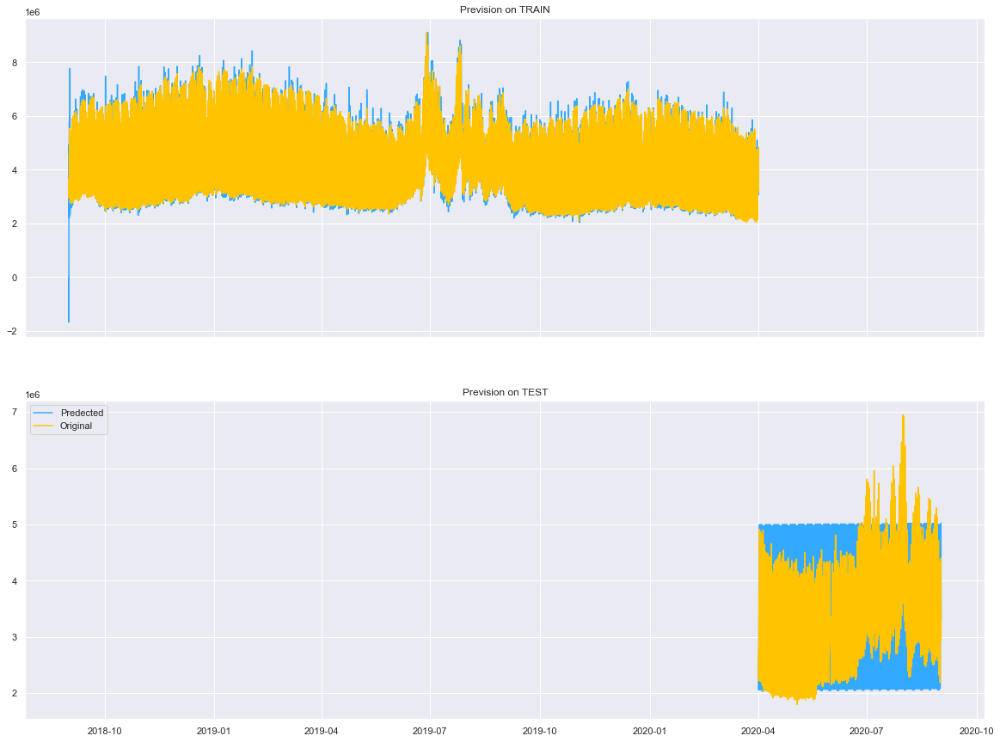

In [53]:
trainx = xreg_train[ : len(train)][['is_weekend', 'is_covid']]
testx = xreg_train[len(train) :][['is_weekend', 'is_covid']]
print("REGRESSORI FESTE")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
print(modUCM2.summary())
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
make_prediction_plot(modUCM2, test, test.index[0], test.index[len(test) - 1], testx,
                   train, train.index[0], train.index[len(train) - 1], trainx)

**Anche in questo caso risulta essere tutto significativo, si procede ora all'inserimento di una stagionalità trigonometrica testando multiple armoniche**

**Mean absolute error TEST: 522509.19049849396**

**Mean absolute error TRAIN: 213249.44761504745**

In [55]:
print("ARMONICHE: 6")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 6},
                                                      {'period': 24*365, 'harmonics' : 6}],
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

# ------------------------------------------------------------------------------------ #

print("ARMONICHE: 8")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 8},
                                                      {'period': 24*365, 'harmonics' : 8}],
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

# ------------------------------------------------------------------------------------ #

print("ARMONICHE: 10")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 10},
                                                      {'period': 24*365, 'harmonics' : 10}],
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

# ------------------------------------------------------------------------------------ #

print("ARMONICHE: 12")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 12},
                                                      {'period': 24*365, 'harmonics' : 12}],
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

# ------------------------------------------------------------------------------------ #

print("ARMONICHE: 14")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift', 
                                     cycle = True,
                                     seasonal = 24,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 14},
                                                      {'period': 24*365, 'harmonics' : 14}],
                                     stochastic_seasonal = True,
                                     exog = trainx)
modUCM2 = modUCM2.fit()
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

ARMONICHE: 6
-------------------------------------
execution time :0:00:27.388478
-------------------------------------
Mean absolute per error TEST: 0.40532857248393583
Mean absolute error TEST: 1289335.1686326393
Mean absolute error TRAIN: 138384.64618041686
Sum of MAE: 1427719.8148130563




ARMONICHE: 8
-------------------------------------
execution time :0:00:38.241622
-------------------------------------
Mean absolute per error TEST: 0.37224885491631166
Mean absolute error TEST: 1165007.2929401842
Mean absolute error TRAIN: 120994.85227302415
Sum of MAE: 1286002.1452132084




ARMONICHE: 10
-------------------------------------
execution time :0:01:08.065139
-------------------------------------
Mean absolute per error TEST: 0.33081401224375856
Mean absolute error TEST: 1060088.465814698
Mean absolute error TRAIN: 120974.16818813412
Sum of MAE: 1181062.6340028322




ARMONICHE: 12
-------------------------------------
execution time :0:00:41.935328
-----------------------------

ARMONICHE: 14
                                 Unobserved Components Results                                  
Dep. Variable:                                   VALORE   No. Observations:                13872
Model:                           random walk with drift   Log Likelihood             -233609.156
                              + stochastic seasonal(24)   AIC                         467232.311
                    + stochastic freq_seasonal(168(14))   BIC                         467285.033
                   + stochastic freq_seasonal(8760(14))   HQIC                        467249.876
                                                + cycle                                         
Date:                                  Thu, 28 Jan 2021                                         
Time:                                          20:41:42                                         
Sample:                                      09-01-2018                                         
                

No handles with labels found to put in legend.


Sum of MAE: 1147621.6574705727






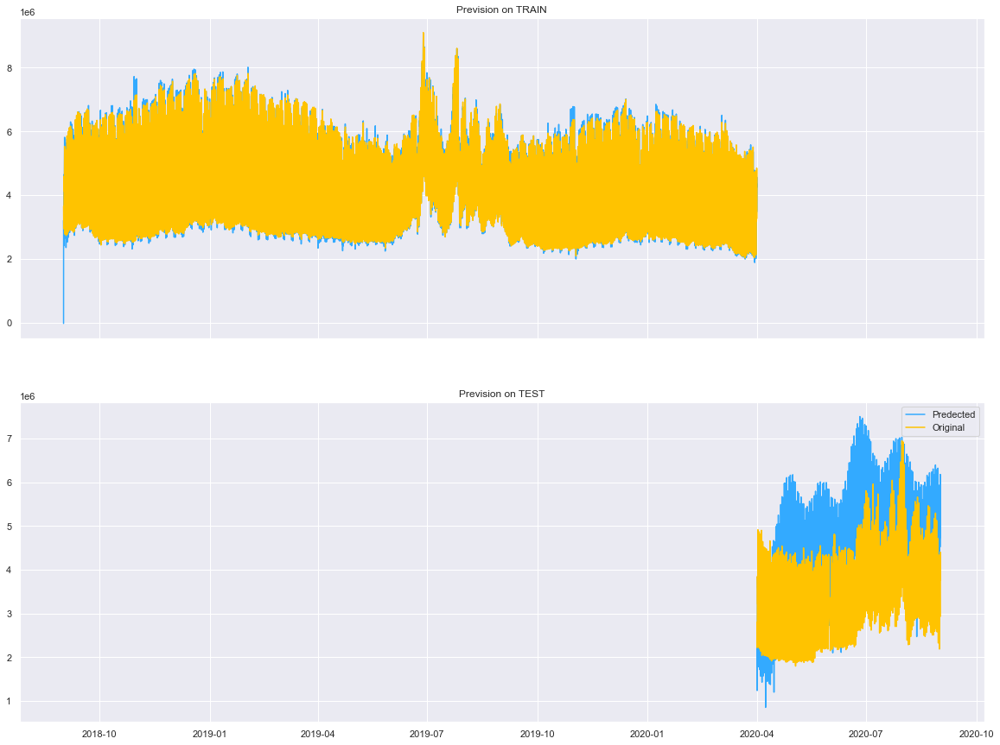

In [66]:
trainx = xreg_train[ : len(train)][['is_weekend', 'is_covid']]
testx = xreg_train[len(train) :][['is_weekend', 'is_covid']]
print("ARMONICHE: 14")
start = datetime.now()
modUCM2 = sm.tsa.UnobservedComponents(train, 'rwdrift',
                                     seasonal = 24,
                                     cycle = True,
                                     freq_seasonal = [{'period': 24*7, 'harmonics' : 14},
                                                      {'period': 24*365, 'harmonics' : 14}],
                                     stochastic_seasonal = True,
                                     exog = trainx)


modUCM2 = modUCM2.fit()
print(modUCM2.summary())
stop = datetime.now()
print("-------------------------------------")
print("execution time :" + str(stop - start))
print("-------------------------------------")
mae_test = make_prediction_test(modUCM2, test, test.index[0], test.index[len(test) - 1], testx)
mae_train = make_prediction_train(modUCM2, train, train.index[0], train.index[len(train) - 1], trainx)
make_prediction_plot(modUCM2, test, test.index[0], test.index[len(test) - 1], testx,
                   train, train.index[0], train.index[len(train) - 1], trainx)
print("Sum of MAE: " + str(mae_train + mae_test))
print("\n\n\n")

### Previsione UCM

In [94]:
final_UCM = sm.tsa.UnobservedComponents(y, 'rwdrift',
                                        seasonal = 24,
                                        cycle = True,
                                        freq_seasonal = [{'period': 24*7, 'harmonics' : 14},
                                                      {'period': 24*365, 'harmonics' : 14}],
                                         stochastic_seasonal = True,
                                         exog = xreg_train[['is_weekend', 'is_covid']])


final_UCM = final_UCM.fit()

In [95]:
xreg_prev_ucm = xreg_test[['is_weekend', 'is_covid']]
pred_ucm = final_UCM.predict(start = xreg_prev_ucm.index[0], end = xreg_prev_ucm.index[len(xreg_prev_ucm) - 1], exog = xreg_prev_ucm, typ = 'linear', dynamic = False)

In [96]:
results_ucm = pd.DataFrame(columns=['date', 'ucm'])
results_ucm['date'] = pred_ucm.index
results_ucm['ucm'] = pred_ucm.values
results_ucm.set_index('date', inplace = True)

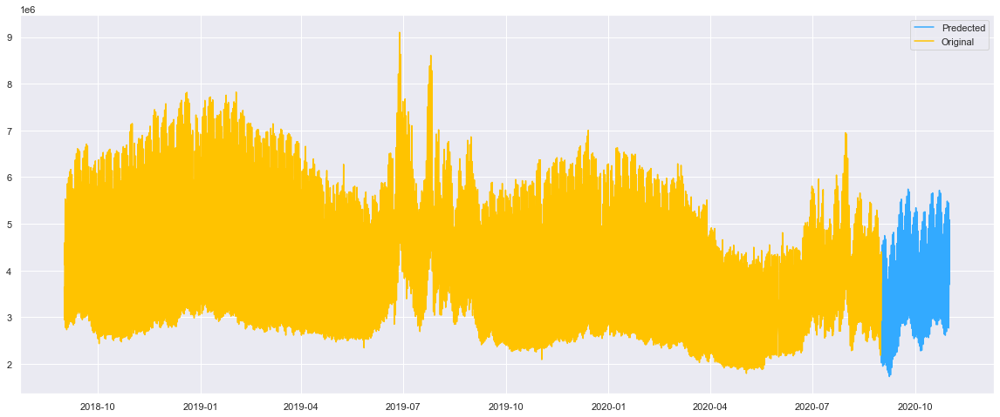

In [97]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred_ucm, color = "#33AAFF", label = "Predected")
plt.plot(y, color = "#FFC300", label = "Original")
plt.legend()

array([[<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>],
       [<AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>, <AxesSubplot:xlabel='Month'>,
        <AxesSubplot:xlabel='Month'>]], dtype=object)

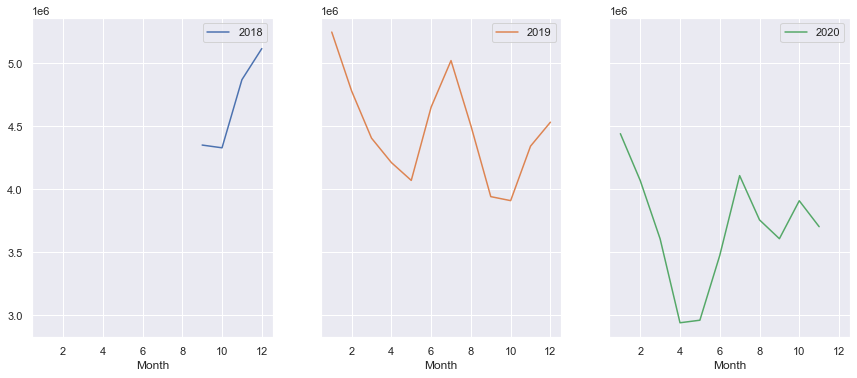

In [98]:
results_ucm = results_ucm.rename(columns = {"ucm" : "VALORE"})
ucm = pd.concat([df, results_ucm])

ucm['Year'] = ucm.index.year
ucm['Month'] = ucm.index.month
ucm['Hour'] = ucm.index.hour
ucm['Weekday_Name'] = ucm.index.day_name()
pd.pivot_table(ucm, values = "VALORE", 
               columns = "Year", index = "Month").plot(subplots = True, figsize=(25, 20), layout=(3, 5), sharey=True)

### Arima + UCM

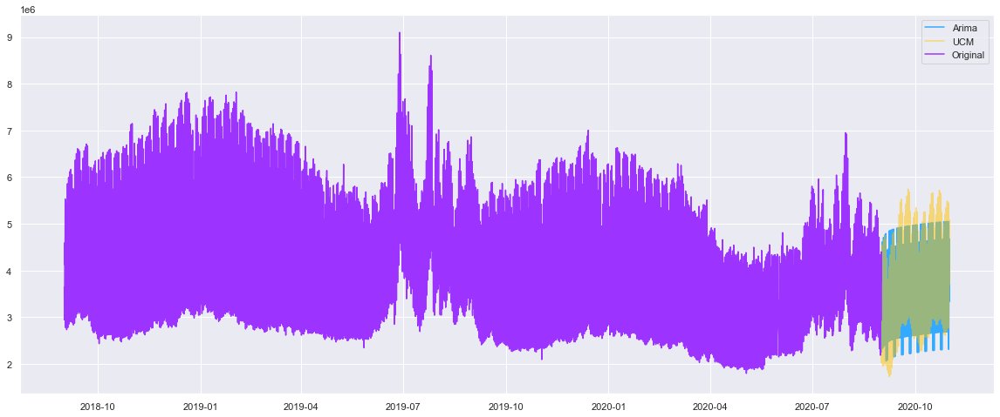

In [99]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred_arima, color = "#33AAFF", label = "Arima")
plt.plot(pred_ucm, color = "#FFC300", label = "UCM", alpha = 0.5)
plt.plot(y, color = "#9D33FF", label = "Original")
plt.legend()

# RNN

**Forecast ricorsivo**

In [100]:
def recursive_forecast(y, model, n_steps, step="1H"):

    # get the dates to forecast
    last_date = y.index[-1] + pd.Timedelta(hours=1)
    fcast_range = pd.date_range(last_date, 
                                periods=n_steps, 
                                freq=step)
    fcasted_values = []
    target = y.copy()
    
    for date in fcast_range:
       
        # build target time series using previously forecast value
        new_point = fcasted_values[-1] if len(fcasted_values) > 0 else 0.0   
        target = target.append(pd.Series(index=[date], data=new_point), ignore_index = True)
        
        # build feature vector using previous forecast values
        features = load_data_full(target, seq_len)[0]
        features= features.reshape(-1, 1, features.shape[1])
        
        # forecast
        
        predictions = model.predict(features)
        print("predicted step: " + str(date) + " value: " + str(predictions[-1, 0]))
        fcasted_values.append(predictions[-1, 0])
    return pd.Series(index=fcast_range, data=fcasted_values)




def load_data_full(df, seq_len):
    X = []
    y = []
    for i in range(seq_len, len(df)):
        X.append(df.iloc[i-seq_len : i])
        y.append(df.iloc[i])

    #3 convert to numpy array
    X = np.array(X)
    y = np.array(y)
    
   
    #4 reshape data to input into RNN models
    X = np.reshape(X, (len(X), seq_len, 1))
    return [X, y]

**Normalizzazione valori**

In [101]:
df = pd.read_csv("TrainingSet.csv", sep = ";")
#create column datetime 
df['DateTime'] = pd.to_datetime(df['DATA']) + pd.to_timedelta(df['Ora'], 'h')   
df.head()                                                                                                  

,DATA,Ora,VALORE,DateTime
0,2018-09-01,1,3646742,2018-09-01 01:00:00
1,2018-09-01,2,3273110,2018-09-01 02:00:00
2,2018-09-01,3,3069245,2018-09-01 03:00:00
3,2018-09-01,4,2969621,2018-09-01 04:00:00
4,2018-09-01,5,2944116,2018-09-01 05:00:00


In [102]:
scaler = MinMaxScaler()
df['v_norm'] = scaler.fit_transform(df['VALORE'].values.reshape(-1, 1))
df = df.set_index(df.DateTime)
y = df.resample('H').sum()["v_norm"] #fill gap
y[y == 0] = np.nan
y = y.interpolate(method = "linear")
train = y[y.index <= ('2020-04-01')]
test = y[y.index > ('2020-04-01')]
print("Train size: " + str(round((len(train) / len(y) * 100), 2)) + "%")
print("Test size: " + str(round((len(test) / len(y) * 100), 2)) + "%")

Train size: 79.07%
Test size: 20.93%


In [103]:
#create train, test data
seq_len = 24 * 150 #choose sequence length
X_train, y_train = load_data_full(train, seq_len)
X_test, y_test = load_data_full(test, seq_len)

print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_train.shape = ',X_test.shape)
print('y_train.shape = ', y_test.shape)

X_train.shape =  (10272, 3600, 1)
y_train.shape =  (10272,)
X_train.shape =  (72, 3600, 1)
y_train.shape =  (72,)


## GRU MODEL

**Model 1 -> tre hidden layer da 128 neuroni ciascuno**

In [3]:
model1 = Sequential()
model1.add(GRU(128, input_shape = (1, seq_len)))
model1.add(Dropout(0.33))
model1.add(BatchNormalization())
model1.add(Dense(128, activation = 'relu'))
model1.add(Dropout(0.33))
model1.add(Dense(128, activation = 'relu'))
model1.add(Dropout(0.33))
model1.add(Dense(1, activation = 'sigmoid'))
model1.compile(loss = 'mae', optimizer = 'adam')
model1.summary()

#history = model1.fit(X_train.reshape(-1, 1, X_train.shape[1]), y_train.reshape(-1, 1), epochs = 100, batch_size = 512)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 128)               1431936   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 128)               512       
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)              

In [10]:
pred1 = recursive_forecast(train[len(train) - 1 - seq_len : ], model1, n_steps = len(test[: 24*7]))

predicted step: 2020-04-01 01:00:00 value: 0.16670024
predicted step: 2020-04-01 02:00:00 value: 0.13221522
predicted step: 2020-04-01 03:00:00 value: 0.12124339
predicted step: 2020-04-01 04:00:00 value: 0.11715916
predicted step: 2020-04-01 05:00:00 value: 0.11966428
predicted step: 2020-04-01 06:00:00 value: 0.13915671
predicted step: 2020-04-01 07:00:00 value: 0.18597755
predicted step: 2020-04-01 08:00:00 value: 0.23857549
predicted step: 2020-04-01 09:00:00 value: 0.27894306
predicted step: 2020-04-01 10:00:00 value: 0.28697842
predicted step: 2020-04-01 11:00:00 value: 0.29302442
predicted step: 2020-04-01 12:00:00 value: 0.3035217
predicted step: 2020-04-01 13:00:00 value: 0.29119062
predicted step: 2020-04-01 14:00:00 value: 0.27680302
predicted step: 2020-04-01 15:00:00 value: 0.27838933
predicted step: 2020-04-01 16:00:00 value: 0.28135228
predicted step: 2020-04-01 17:00:00 value: 0.29773247
predicted step: 2020-04-01 18:00:00 value: 0.3347538
predicted step: 2020-04-01 19:

In [11]:
metrics.mean_absolute_error(y_pred = scaler.inverse_transform(pred1.values.reshape(-1, 1)), 
                            y_true = scaler.inverse_transform(test[: 24*7].values.reshape(-1,1)))

784332.9872290194

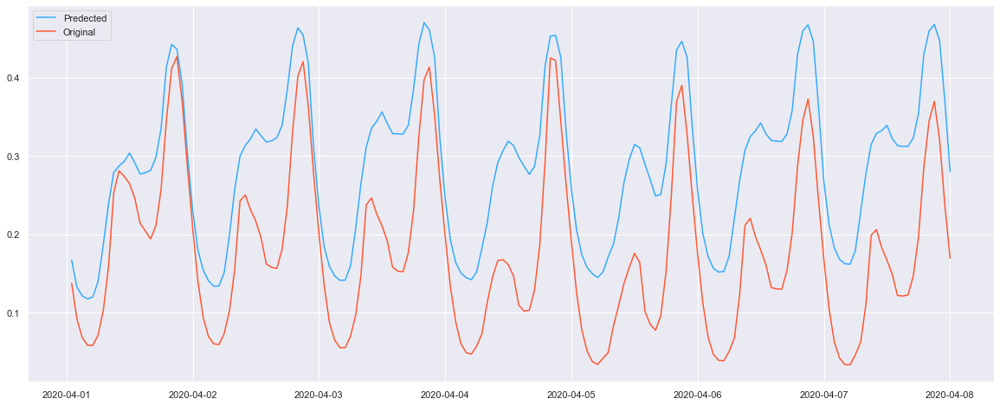

In [12]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred1, color = "#33AAFF", label = "Predected")
plt.plot(test[: 24*7], color = "#FF5733", label = "Original")
plt.legend()

**Model 2 -> Tre hidden layer da 512 neuroni ciascuno**

In [13]:
model2 = Sequential()
model2.add(GRU(512, input_shape = (1, seq_len)))
model2.add(Dropout(0.33))
model2.add(BatchNormalization())
model2.add(Dense(512, activation = 'relu'))
model2.add(Dropout(0.33))
model2.add(Dense(512, activation = 'relu'))
model2.add(Dropout(0.33))
model2.add(Dense(1, activation = 'sigmoid'))
model2.compile(loss = 'mae', optimizer = 'adam')
model2.summary()

history = model2.fit(X_train.reshape(-1, 1, X_train.shape[1]), y_train.reshape(-1, 1), epochs = 100, batch_size = 512)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_2 (GRU)                  (None, 512)               6317568   
_________________________________________________________________
dropout_4 (Dropout)          (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_5 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_6 (Dropout)          (None, 512)              

In [15]:
pred2 = recursive_forecast(train[len(train) - 1 - seq_len : ], model2, n_steps = len(test[: 24*7]))

predicted step: 2020-04-01 01:00:00 value: 0.08359213
predicted step: 2020-04-01 02:00:00 value: 0.053201597
predicted step: 2020-04-01 03:00:00 value: 0.042086277
predicted step: 2020-04-01 04:00:00 value: 0.0383098
predicted step: 2020-04-01 05:00:00 value: 0.041230418
predicted step: 2020-04-01 06:00:00 value: 0.05976689
predicted step: 2020-04-01 07:00:00 value: 0.10715822
predicted step: 2020-04-01 08:00:00 value: 0.18905157
predicted step: 2020-04-01 09:00:00 value: 0.25844
predicted step: 2020-04-01 10:00:00 value: 0.28634456
predicted step: 2020-04-01 11:00:00 value: 0.29802388
predicted step: 2020-04-01 12:00:00 value: 0.31569293
predicted step: 2020-04-01 13:00:00 value: 0.29194474
predicted step: 2020-04-01 14:00:00 value: 0.2749763
predicted step: 2020-04-01 15:00:00 value: 0.28889114
predicted step: 2020-04-01 16:00:00 value: 0.29435545
predicted step: 2020-04-01 17:00:00 value: 0.31404912
predicted step: 2020-04-01 18:00:00 value: 0.35142773
predicted step: 2020-04-01 19:

In [16]:
metrics.mean_absolute_error(y_pred = scaler.inverse_transform(pred2.values.reshape(-1, 1)), 
                            y_true = scaler.inverse_transform(test[: 24*7].values.reshape(-1,1)))

637249.9223467101

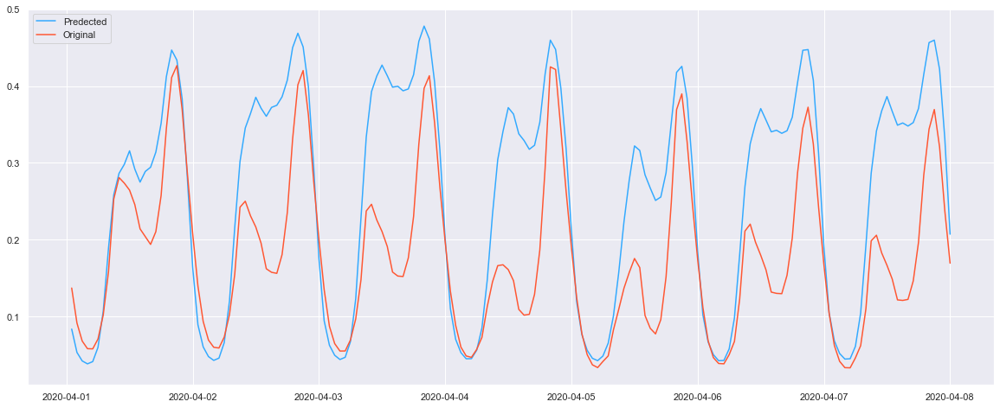

In [17]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred2, color = "#33AAFF", label = "Predected")
plt.plot(test[: 24*7], color = "#FF5733", label = "Original")
plt.legend()

**Model 3 -> Tre hidden layer da 512 neuroni ciascuno: LSTM**

In [18]:
model3 = Sequential()
model3.add(LSTM(512, input_shape = (1, seq_len)))
model3.add(Dropout(0.33))
model3.add(BatchNormalization())
model3.add(Dense(512, activation = 'relu'))
model3.add(Dropout(0.33))
model3.add(Dense(512, activation = 'relu'))
model3.add(Dropout(0.33))
model3.add(Dense(1, activation = 'sigmoid'))
model3.compile(loss = 'mae', optimizer = 'adam')
model3.summary()

history = model3.fit(X_train.reshape(-1, 1, X_train.shape[1]), y_train.reshape(-1, 1), epochs = 100, batch_size = 512)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 512)               8423424   
_________________________________________________________________
dropout_7 (Dropout)          (None, 512)               0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 512)               2048      
_________________________________________________________________
dense_7 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_8 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_9 (Dropout)          (None, 512)              

In [19]:
pred3 = recursive_forecast(train[len(train) - 1 - seq_len : ], model3, n_steps = len(test[: 24*7]))

predicted step: 2020-04-01 01:00:00 value: 0.15994658
predicted step: 2020-04-01 02:00:00 value: 0.1105447
predicted step: 2020-04-01 03:00:00 value: 0.0931369
predicted step: 2020-04-01 04:00:00 value: 0.0828476
predicted step: 2020-04-01 05:00:00 value: 0.08139579
predicted step: 2020-04-01 06:00:00 value: 0.099867634
predicted step: 2020-04-01 07:00:00 value: 0.1745093
predicted step: 2020-04-01 08:00:00 value: 0.2747556
predicted step: 2020-04-01 09:00:00 value: 0.33106905
predicted step: 2020-04-01 10:00:00 value: 0.33318093
predicted step: 2020-04-01 11:00:00 value: 0.33088827
predicted step: 2020-04-01 12:00:00 value: 0.34127337
predicted step: 2020-04-01 13:00:00 value: 0.3201977
predicted step: 2020-04-01 14:00:00 value: 0.30178452
predicted step: 2020-04-01 15:00:00 value: 0.30619514
predicted step: 2020-04-01 16:00:00 value: 0.30690414
predicted step: 2020-04-01 17:00:00 value: 0.31812403
predicted step: 2020-04-01 18:00:00 value: 0.35328233
predicted step: 2020-04-01 19:00:

In [20]:
metrics.mean_absolute_error(y_pred = scaler.inverse_transform(pred3.values.reshape(-1, 1)), 
                            y_true = scaler.inverse_transform(test[: 24*7].values.reshape(-1,1)))

1066413.4638567383

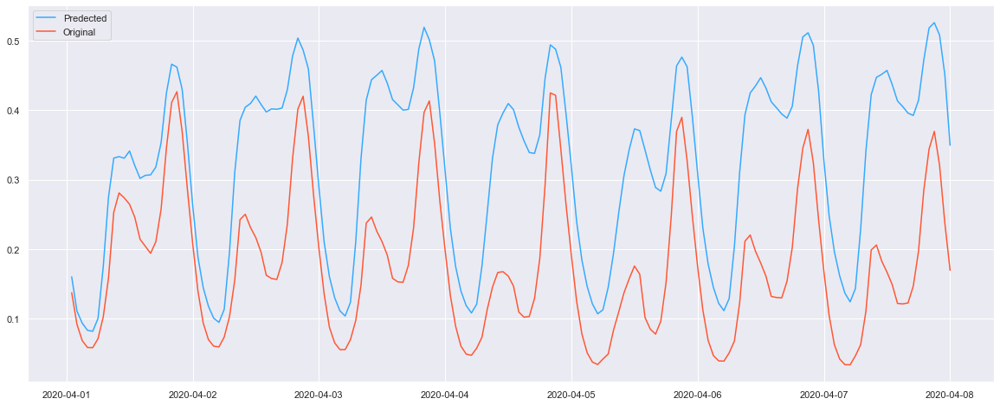

In [21]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred3, color = "#33AAFF", label = "Predected")
plt.plot(test[: 24*7], color = "#FF5733", label = "Original")
plt.legend()

**Modello Finale**

In [104]:
final_model = load_model("model_lstm_512_3_GRU033.h5")

In [105]:
pred = recursive_forecast(train[len(train) - 1 - seq_len : ], final_model, n_steps = len(test))

predicted step: 2020-08-16 14:00:00 value: 0.062195897
predicted step: 2020-08-16 15:00:00 value: 0.09188959
predicted step: 2020-08-16 16:00:00 value: 0.12033117
predicted step: 2020-08-16 17:00:00 value: 0.15424103
predicted step: 2020-08-16 18:00:00 value: 0.1905981
predicted step: 2020-08-16 19:00:00 value: 0.21644247
predicted step: 2020-08-16 20:00:00 value: 0.22899592
predicted step: 2020-08-16 21:00:00 value: 0.2292251
predicted step: 2020-08-16 22:00:00 value: 0.2320835
predicted step: 2020-08-16 23:00:00 value: 0.26580054
predicted step: 2020-08-17 00:00:00 value: 0.33575904
predicted step: 2020-08-17 01:00:00 value: 0.41592044
predicted step: 2020-08-17 02:00:00 value: 0.46632642
predicted step: 2020-08-17 03:00:00 value: 0.45671403
predicted step: 2020-08-17 04:00:00 value: 0.3034519
predicted step: 2020-08-17 05:00:00 value: 0.19826138
predicted step: 2020-08-17 06:00:00 value: 0.13203439
predicted step: 2020-08-17 07:00:00 value: 0.08656499
predicted step: 2020-08-17 08:0

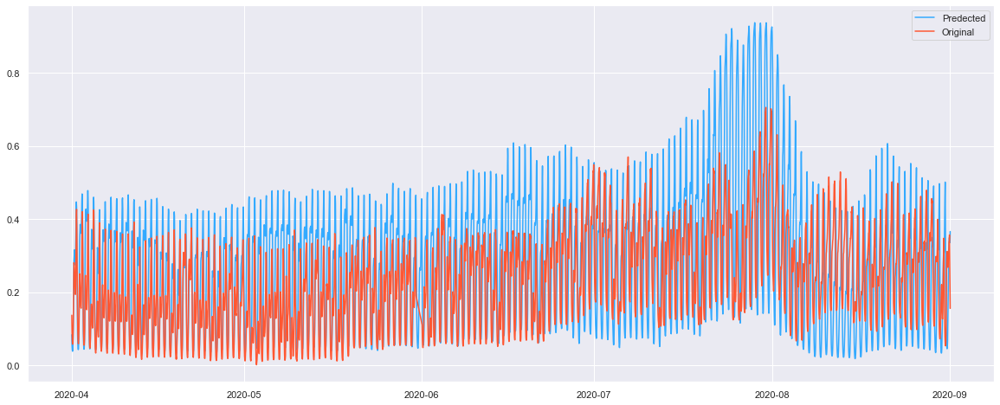

In [106]:
plt.rcParams.update({'figure.figsize':(20, 8)})
plt.plot(pred, color = "#33AAFF", label = "Predected")
plt.plot(test, color = "#FF5733", label = "Original")
plt.legend()

In [107]:
metrics.mean_absolute_error(y_pred = scaler.inverse_transform(pred.values.reshape(-1, 1)), 
                            y_true = scaler.inverse_transform(test.values.reshape(-1,1)))

978158.6308213307

In [108]:
forecast = recursive_forecast(y[len(y) - 1 - seq_len : ], final_model, n_steps = 24 * 61)

ed step: 2020-10-16 12:00:00 value: 0.5712216
predicted step: 2020-10-16 13:00:00 value: 0.58234763
predicted step: 2020-10-16 14:00:00 value: 0.55997515
predicted step: 2020-10-16 15:00:00 value: 0.52497894
predicted step: 2020-10-16 16:00:00 value: 0.4964006
predicted step: 2020-10-16 17:00:00 value: 0.4849952
predicted step: 2020-10-16 18:00:00 value: 0.49369535
predicted step: 2020-10-16 19:00:00 value: 0.5375802
predicted step: 2020-10-16 20:00:00 value: 0.5888539
predicted step: 2020-10-16 21:00:00 value: 0.6243241
predicted step: 2020-10-16 22:00:00 value: 0.643566
predicted step: 2020-10-16 23:00:00 value: 0.6355131
predicted step: 2020-10-17 00:00:00 value: 0.6014527
predicted step: 2020-10-17 01:00:00 value: 0.5478483
predicted step: 2020-10-17 02:00:00 value: 0.45622128
predicted step: 2020-10-17 03:00:00 value: 0.33199325
predicted step: 2020-10-17 04:00:00 value: 0.22156557
predicted step: 2020-10-17 05:00:00 value: 0.16600415
predicted step: 2020-10-17 06:00:00 value: 0.1

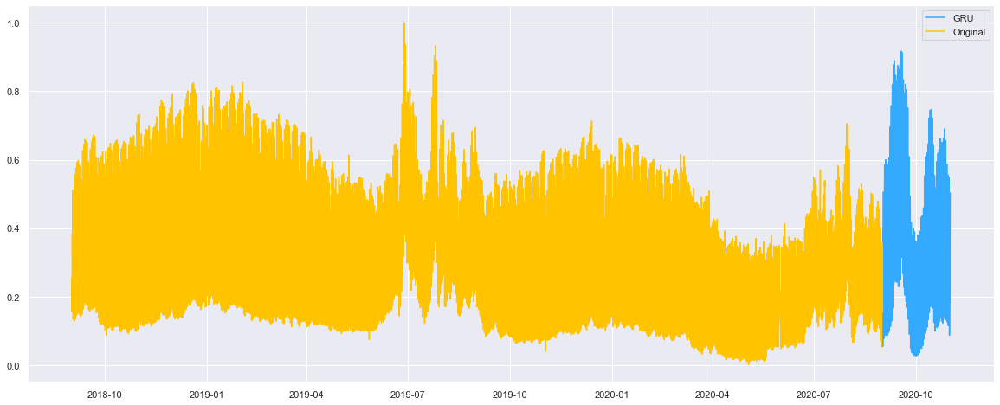

In [109]:
plt.rcParams.update({'figure.figsize': (20, 8)})
plt.plot(forecast, color = "#33AAFF", label = "GRU")
plt.plot(y, color = "#FFC300", label = "Original")
plt.legend()

In [24]:
### ARIMA + UCM + GRU

In [110]:
retransformed = scaler.inverse_transform(forecast.values.reshape(-1,1))
df_ml = pd.DataFrame(index = forecast.index.strftime("%Y-%m-%d %H:%M:%S").values, data = retransformed.reshape(len(retransformed)))
df_ml.rename(columns = {0 : "VALORE"}, inplace = True)
df_ml

,VALORE
2020-09-01 01:00:00,2.990065e+06
2020-09-01 02:00:00,2.470394e+06
2020-09-01 03:00:00,2.295754e+06
2020-09-01 04:00:00,2.216138e+06
2020-09-01 05:00:00,2.200254e+06
...,...
2020-10-31 20:00:00,4.357356e+06
2020-10-31 21:00:00,4.799216e+06
2020-10-31 22:00:00,5.140028e+06
2020-10-31 23:00:00,5.328742e+06


In [111]:
df_ml.index = pd.to_datetime(df_ml.index)

In [112]:
pred_gru = df_ml.resample('H').sum()["VALORE"] #fill gap
pred_gru[pred_gru == 0] = np.nan
pred_gru = pred_gru.interpolate(method = "linear")
pred_gru

2020-09-01 01:00:00    2.990065e+06
2020-09-01 02:00:00    2.470394e+06
2020-09-01 03:00:00    2.295754e+06
2020-09-01 04:00:00    2.216138e+06
2020-09-01 05:00:00    2.200254e+06
                           ...     
2020-10-31 20:00:00    4.357356e+06
2020-10-31 21:00:00    4.799216e+06
2020-10-31 22:00:00    5.140028e+06
2020-10-31 23:00:00    5.328742e+06
2020-11-01 00:00:00    5.467533e+06
Freq: H, Name: VALORE, Length: 1464, dtype: float64

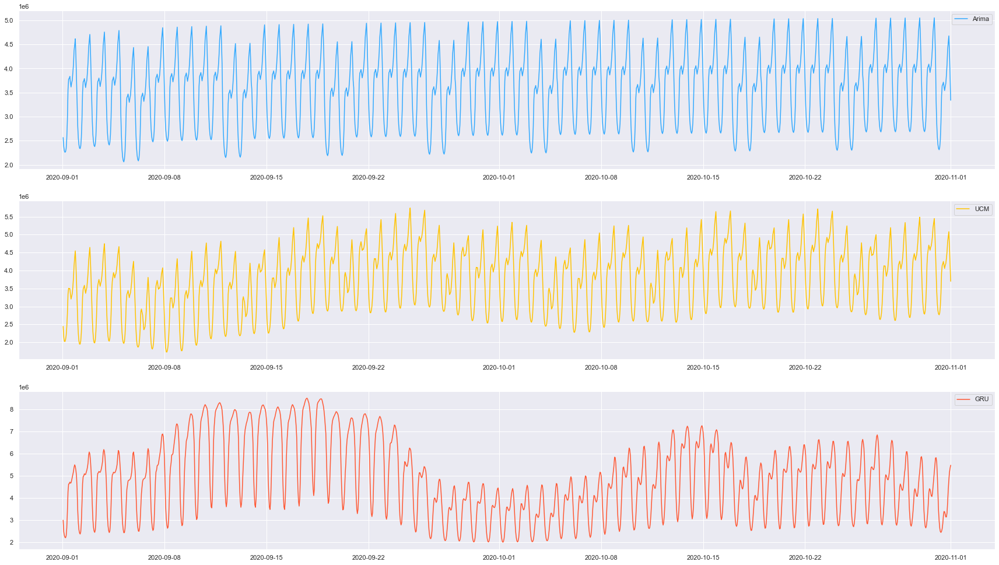

In [113]:
plt.rcParams.update({'figure.figsize':(30, 17)})

fig, axes = plt.subplots(nrows = 3, ncols = 1)

axes[0].plot(pred_arima, color = "#33AAFF", label = "Arima")
axes[1].plot(pred_ucm, color = "#FFC300", label = "UCM")
axes[2].plot(pred_gru, color = "#FF5733", label = "GRU")
#plt.plot(y, color = "#9D33FF", label = "Original")
axes[0].legend()
axes[1].legend()
axes[2].legend()

In [114]:
forecast_finale = pd.concat([results_arima, results_ucm, df_ml], axis = 1)
forecast_finale

,arima,VALORE,VALORE
2020-09-01 01:00:00,2.566125e+06,2.444642e+06,2.990065e+06
2020-09-01 02:00:00,2.377187e+06,2.149374e+06,2.470394e+06
2020-09-01 03:00:00,2.288566e+06,2.031318e+06,2.295754e+06
2020-09-01 04:00:00,2.259052e+06,2.022685e+06,2.216138e+06
2020-09-01 05:00:00,2.273740e+06,2.078101e+06,2.200254e+06
...,...,...,...
2020-10-31 20:00:00,4.536562e+06,4.946125e+06,4.357356e+06
2020-10-31 21:00:00,4.677746e+06,5.084163e+06,4.799216e+06
2020-10-31 22:00:00,4.351507e+06,4.686876e+06,5.140028e+06
2020-10-31 23:00:00,3.875981e+06,4.217647e+06,5.328742e+06


In [115]:
forecast_finale.reset_index(inplace = True)
forecast_finale

,index,arima,VALORE,VALORE
0,2020-09-01 01:00:00,2.566125e+06,2.444642e+06,2.990065e+06
1,2020-09-01 02:00:00,2.377187e+06,2.149374e+06,2.470394e+06
2,2020-09-01 03:00:00,2.288566e+06,2.031318e+06,2.295754e+06
3,2020-09-01 04:00:00,2.259052e+06,2.022685e+06,2.216138e+06
4,2020-09-01 05:00:00,2.273740e+06,2.078101e+06,2.200254e+06
...,...,...,...,...
1459,2020-10-31 20:00:00,4.536562e+06,4.946125e+06,4.357356e+06
1460,2020-10-31 21:00:00,4.677746e+06,5.084163e+06,4.799216e+06
1461,2020-10-31 22:00:00,4.351507e+06,4.686876e+06,5.140028e+06
1462,2020-10-31 23:00:00,3.875981e+06,4.217647e+06,5.328742e+06


In [116]:
hours = forecast_finale['index'].dt.hour
hours

0        1
1        2
2        3
3        4
4        5
        ..
1459    20
1460    21
1461    22
1462    23
1463     0
Name: index, Length: 1464, dtype: int64

In [117]:
forecast_finale['Ora'] = hours
forecast_finale

,index,arima,VALORE,VALORE,Ora
0,2020-09-01 01:00:00,2.566125e+06,2.444642e+06,2.990065e+06,1
1,2020-09-01 02:00:00,2.377187e+06,2.149374e+06,2.470394e+06,2
2,2020-09-01 03:00:00,2.288566e+06,2.031318e+06,2.295754e+06,3
3,2020-09-01 04:00:00,2.259052e+06,2.022685e+06,2.216138e+06,4
4,2020-09-01 05:00:00,2.273740e+06,2.078101e+06,2.200254e+06,5
...,...,...,...,...,...
1459,2020-10-31 20:00:00,4.536562e+06,4.946125e+06,4.357356e+06,20
1460,2020-10-31 21:00:00,4.677746e+06,5.084163e+06,4.799216e+06,21
1461,2020-10-31 22:00:00,4.351507e+06,4.686876e+06,5.140028e+06,22
1462,2020-10-31 23:00:00,3.875981e+06,4.217647e+06,5.328742e+06,23


In [118]:
forecast_finale.columns = ['Data', 'ARIMA', 'UCM', 'ML', 'Ora']

In [119]:
forecast_finale['Data'] = forecast_finale['Data'].dt.date

In [120]:
forecast_finale[forecast_finale['Ora']]

,Data,ARIMA,UCM,ML,Ora
0,2020-09-01,2.566125e+06,2.444642e+06,2.990065e+06,1
1,2020-09-01,2.377187e+06,2.149374e+06,2.470394e+06,2
2,2020-09-01,2.288566e+06,2.031318e+06,2.295754e+06,3
3,2020-09-01,2.259052e+06,2.022685e+06,2.216138e+06,4
4,2020-09-01,2.273740e+06,2.078101e+06,2.200254e+06,5
...,...,...,...,...,...
1459,2020-10-31,4.536562e+06,4.946125e+06,4.357356e+06,20
1460,2020-10-31,4.677746e+06,5.084163e+06,4.799216e+06,21
1461,2020-10-31,4.351507e+06,4.686876e+06,5.140028e+06,22
1462,2020-10-31,3.875981e+06,4.217647e+06,5.328742e+06,23


In [86]:
forecast_finale.to_csv("forecast_finale.csv", sep = ";")